In [3]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import math
import os



Cilj ovog zadatka jeste realizacija DoG detektora obeležja, opsivanje detektovanih obeležja, njihovo uparivanje sa istim obeležijima na drugim slikama, provera robusnosti metode u odnosu na razne transformacije kao i pravljenje panorame na osnovu niza slika.
Kako bismo to uradili najpre je neophodno kreiranje Gausove piramide. Ispod je data funkcija koja za datu sliku kreira Gausovu piramidu. Moguće je podešavati standardnu devijaciju Gausovog filtra kao i širinu prozora koji on koristi. Takođe podesivi parametar je i faktor povećanja standardne devijacije za određivanje narednog nivoa piramide koja se računa kao $\sigma_l = k^l\sigma_0$, gde $l$ predstavlja nivo piramide kao i broj nivoa piramide. Treba napomenuti da kako bismo kasnije kreirali DoG piramidu od nivoa 0 do numLevel - 1 neophodno je da kreiramo Gausovu piramidu od nivoa -1 do nivoa numLevel - 1. 

In [4]:
def createPyramid(img,sigma0=1.0,k=np.sqrt(2),numLevels=5):
    pyramid = []
    level = -1
    while level < numLevels:
        sigma = k**(level)*sigma0
        pyramid.append(cv.GaussianBlur(img,(15,15),sigma))
        level += 1
        
    return pyramid

Učitana je slika modela konzerve kao grayscale i skalirana na interval od nula do 1. Slika je i prikazana ispod.

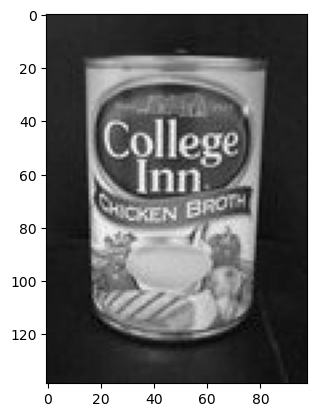

In [5]:
img = cv.imread("imgs/can/can_model.jpg",cv.IMREAD_GRAYSCALE)
img = (img - np.min(img))/(np.max(img)-np.min(img))

plt.imshow(img,cmap='gray')
plt.show()

Izračunata je Gausova piramida od nivoa -1 do nivoa 4 korišćenjem Gausovog filtra kvadratnog prozora veličine 15.
Početna standardna devijacija je 1, a faktor uvećanja $\sqrt{2}$. Odmah ispod je i prikazana ova piramida.

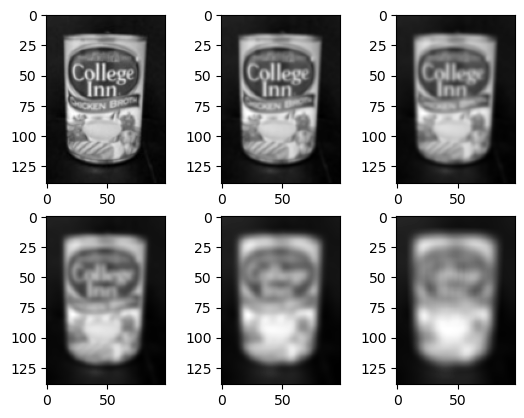

In [6]:
pyramid = createPyramid(img)

for i in range(len(pyramid)):
    plt.subplot(2,3,i+1)
    plt.imshow(pyramid[i],cmap='gray')


Kako smo već izračunali Gausovu piramidu DoG piramidu dobijamo veoma jednostavno oduzimanjem susednih članova Gausove piramide. Nakon kreiranja DoG piramida je odmah i prikazana.

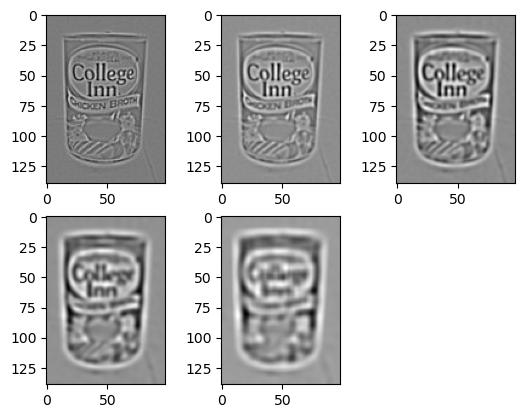

In [7]:
DoGPyramid = []
for i in range(1,len(pyramid)):
    DoGPyramid.append(pyramid[i]-pyramid[i-1])

for i in range(len(DoGPyramid)):
    plt.subplot(2,3,i+1)
    plt.imshow(DoGPyramid[i],cmap='gray')

Nakon kreiranja DoG piramide koristimo je za izvlačenje obeležja na slici. Potencijalna obeležja su svi pikseli koji predstavljaju lokalni ekstremum u svom susedstvu. Susedstvo piksela definišemo kao 8 piksela iz skale datog piksela koji ga dodiruju kao i po jedan piksel na istoj poziciji iz susednih skala. Takođe neophodno je ukloniti obeležja koja predstavljaju uniformne površine koja se često detektuju zbog prisustva šuma. Ovo je moguće jednostavno uraditi poređenjem vrednosti piksela sa pragom (u našem slučaju 0.03). Takođe, ovaj način detekcije potencijalnih obeležja će pronaći i ivice što nama nije cilje te je i njih neophodno izbaciti. Kako bi to bilo urađeno korišćen je kriterijum na bazi sopstvenih vrednosti hesijana. Ideja je da ukoliko su sopstvene vrednosti bliske detektovana tačka je deo kružne oblasti te predstavlja ćošak, dok ukoliko je jedna sopstvena vrednost dominantna detektovana tačka je deo ivice te je odbacujemo. Kriterijum se definiše kao: $r + \frac{1}{r} + 2 < edgeThr $, gde r predstavlja odnos sopstvenih vrednosti, a edgeThr prag koji je u našem slučaju 12.0. Prag za uniformne površine treba postaviti tako da je dovoljno velik da ukloni tačke koje su posledica šuma, ali dovoljno mali da ne ukloni tačke koje zaista predstavljaju ćoškove na slici. Prag za ivice treba biti dovoljno mali da ukloni tačke koje su deo ivice, ali dovoljno veliki da ne ukloni tačke koje predstavljaju ćoškove.

In [8]:
def detectDoGFeatures(DoGPyramid,uniformThr=0.03,edgeThr=12.0):
    features = []
    
    for k in range(len(DoGPyramid)):
        image = DoGPyramid[k]
        
        grad_x = cv.Sobel(image,cv.CV_64F,1,0,ksize=3)
        grad_y = cv.Sobel(image,cv.CV_64F,0,1,ksize=3)
        
        Dxx = cv.Sobel(grad_x,cv.CV_64F,1,0,ksize=3)
        Dxy = cv.Sobel(grad_x,cv.CV_64F,0,1,ksize=3)
        Dyy = cv.Sobel(grad_y,cv.CV_64F,0,1,ksize=3)
        
        height, width = image.shape
        
        
        for i in range(height):
            for j in range(width):
                neighbours = []
                for m in range(-1,2):
                    for n in range(-1,2):
                        if (i+m >= 0) and (i + m < height) and (j + n >= 0) and (j + n < width) : 
                            neighbours.append(image[i+m,j+n])
                            
                if (k - 1 >= 0):
                    neighbours.append(DoGPyramid[k-1][i][j])

                        
                if (k + 1 < len(DoGPyramid)):
                    neighbours.append(DoGPyramid[k][i][j])

                
                neighbours = np.array(neighbours)
                if ((np.min(neighbours) == image[i,j]) or (np.max(neighbours) == image[i,j])) and (np.abs(image[i,j]) > uniformThr) :            
                    
                    if (Dxx[i,j]*Dyy[i,j] - Dxy[i,j]**2 == 0):
                        continue
                        
                    R = (Dxx[i,j] + Dyy[i,j])**2/(Dxx[i,j]*Dyy[i,j]-Dxy[i,j]**2)
                    
                    if np.abs(R) < edgeThr:
                        features.append(np.array([i,j,k]))
                
    
    features = np.array(features)
    
    return features

Na slici ispod možemo videti koje su sve tačke detektovane bez odbacivanja uniformnih regiona i ivica.

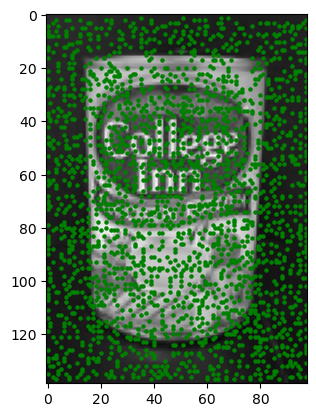

In [9]:
features = detectDoGFeatures(DoGPyramid,0,np.inf)
height, width = img.shape
extremum_mask = np.zeros((height,width),dtype = np.byte)
for i in range(len(features)):
    extremum_mask[features[i][0],features[i][1]] = 1
    
y, x = np.where(extremum_mask == 1)

plt.figure()
plt.imshow(img,cmap='gray')
plt.scatter(x,y,c='green',marker='o',s=5)
plt.show()

Slika ispod predstavlja detektovane tačke nakon odbacivanja onih koji su deo uniformnih regiona. Možemo zaključiti da je ovo uspešno urađeno

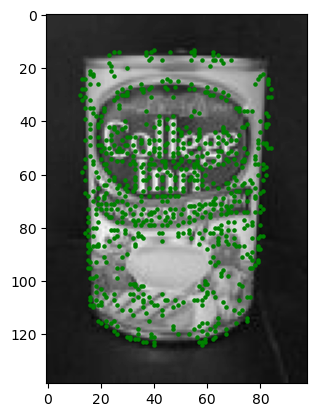

In [10]:
features = detectDoGFeatures(DoGPyramid,0.03,np.inf)
height, width = img.shape
extremum_mask = np.zeros((height,width),dtype = np.byte)
for i in range(len(features)):
    extremum_mask[features[i][0],features[i][1]] = 1
    
y, x = np.where(extremum_mask == 1)

plt.figure()
plt.imshow(img,cmap='gray')
plt.scatter(x,y,c='green',marker='o',s=5)
plt.show()

Slika dole predstavlja finalna detektovana obeležja odnosno predstavlja gornju sliku nakon odbacivanja obeležja koja su deo ivica.

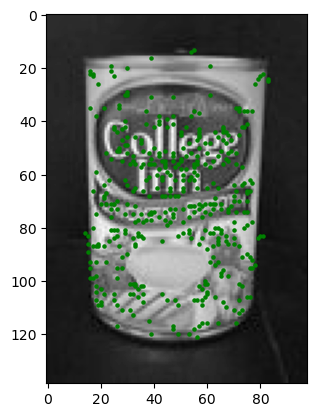

In [11]:
features = detectDoGFeatures(DoGPyramid)
height, width = img.shape
extremum_mask = np.zeros((height,width),dtype = np.byte)
for i in range(len(features)):
    extremum_mask[features[i][0],features[i][1]] = 1
    
y, x = np.where(extremum_mask == 1)

plt.figure()
plt.imshow(img,cmap='gray')
plt.scatter(x,y,c='green',marker='o',s=5)
plt.show()

Nakon detekcije obeležja neophodno je ih opisati kako bi bilo moguće uparati ih sa istim obeležijima na drugim slikama. Za ovo je korišćen BRIEF deskriptor. BRIEF predstavlja jednostavan i brz deskriptor pravljen za korišćenje u realnom vremenu na platformama sa smanjenim resursima. Najpre je neophodno generisati parove tačaka u okviru patch-a. Tačke su uzorkovane iz uniformne raspodele i korišćen je seed radi ponovljivosti rezultata. Svaki test daje vrednost jednom bitu te deskriptor zauzima onoliko bitova memorije koliko imamo testova odnosno parova tačaka (256 u našem slučaju). Ona obeležja koja se nalaze na rubovima slike odnosno nemaju potpun patch su odbačena. Za uparivanje obeležja korišćeno je Hamingovo rastojanje koje se dobija kao suma rezultata XOR operacije dva niza bita. Obeležje sa prve slike uparujemo sa obeležjem iz druge slike koje daje najmanje Hamingovo rastojanje. Ovde postoji dva problema. Prvi je taj da je moguće da na slici postoji dosta obeležja sa sličnom okolinom te nismo sigurni sa kojim da uparimo obeležje koje posmatramo. Zbog ovoga se uvodi količnički test to jest vrednost Hamingovog rastojanja najsličnijeg deskriptora mora biti manji od određenog procenta drugog najsličnijeg deskriptora (u našem slučaju 80%). Na ovaj način ćemo izbeći da tačku na jednoj slici uparimo sa tačkom na drugoj slici koja ne potiče od istog sadržaja. Drugi problem jesta taj da je moguće da obeležje na jednoj slici uopšte ne postoji na drugoj. Zbog ovoga se uvodi unakrsno testiranja parova. Odnosno obeležja uparujemo samo ako su uparena i onda ako slike zamene mesta. 

In [12]:
def generateBRIEFpattern(patchSize=9,testNum=256):
    np.random.seed(0)
    p1Coords = np.random.randint(patchSize,size=(testNum,2)) - patchSize//2
    np.random.seed(42)
    p2Coords = np.random.randint(patchSize,size=(testNum,2)) - patchSize//2
    
    return p1Coords, p2Coords

def computePyrBRIEF(GaussianPyramid,featureLocations,p1Coords,p2Coords,k=np.sqrt(2),patchSize=9):
    descBRIEF = []
    locBRIEF = []
    
    height, width = GaussianPyramid[0].shape
    testNum =  len(p1Coords)
    
    for loc in featureLocations:
        x,y,level = loc
        
        image = GaussianPyramid[level+1]
        
        if level != 0:
            
            p1CoordsScaled = np.int64(np.round(p1Coords*(k**level)))
            p2CoordsScaled = np.int64(np.round(p2Coords*(k**level)))
        
        else:
            p1CoordsScaled = p1Coords
            p2CoordsScaled = p2Coords
            
        patch = np.max(p1CoordsScaled)
        
        # provera da li postoji potpun patch oko datog piksela
        if (x - patch < 0) or (x + patch >= height) or (y - patch < 0) or (y + patch >= width):
            continue
            
        descriptor = np.zeros(testNum,dtype=np.byte)
        t1 = p1CoordsScaled + np.array([x,y])
        t2 = p2CoordsScaled + np.array([x,y])
        
        p1 = image[t1[:,0],t1[:,1]]
        p2 = image[t2[:,0],t2[:,1]]
        
        descriptor = p1 < p2
        
                
        descBRIEF.append(descriptor)
        locBRIEF.append(loc)
        
    descBRIEF = np.array(descBRIEF)
    locBRIEF = np.array(locBRIEF)
    
    return descBRIEF, locBRIEF
             

def computeMatches(descriptor1,location1,descriptor2,location2,ratioThr):
    matches = []

    for i in range(len(descriptor1)):
        desc1 = descriptor1[i,:]
        loc1 = location1[i,:-1]

        distances = np.sum(np.logical_xor(descriptor1[i,:],descriptor2),axis=1)

        min_id = np.argmin(distances)
        first = distances[min_id]
        first_loc = location2[min_id,:-1]
        masked = np.ma.array(distances, mask=False)
        masked.mask[min_id] = True
        s_min_id = np.argmin(masked)
        second = distances[s_min_id]

        if second and first/second < ratioThr:
            matches.append([loc1,first_loc,first])
                    
    return matches

def matchBRIEF(descriptor1,location1,descriptor2,location2,ratioThr=0.8,crossCheck=False):
    
    matches1 = computeMatches(descriptor1,location1,descriptor2,location2,ratioThr)
    
    if crossCheck:
        matches2 = computeMatches(descriptor2,location2,descriptor1,location1,ratioThr)
    
    matches = []
    if crossCheck:
        
        for match1 in matches1:
            x1,y1,d1 = match1
            for match2 in matches2:
                y2,x2,d2 = match2
                if (x1[0] == x2[0]) and (x1[1] == x2[1]) and (y1[0] == y2[0]) and (y1[1] == y2[1]):
                    matches.append(match1)
                    break
        
    else:
        matches = matches1
    
    return matches

In [13]:
p1Coords, p2Coords = generateBRIEFpattern()
descBRIEF, locBRIEF = computePyrBRIEF(pyramid,features,p1Coords,p2Coords)

Sada imamo deskriptore obeležja na slici modela konzerve te ćemo pokušati da uparimo ta obeležja na drugoj slici na kojoj se nalazi identična konzerva, ali pored toga postoje još neke konzerve.

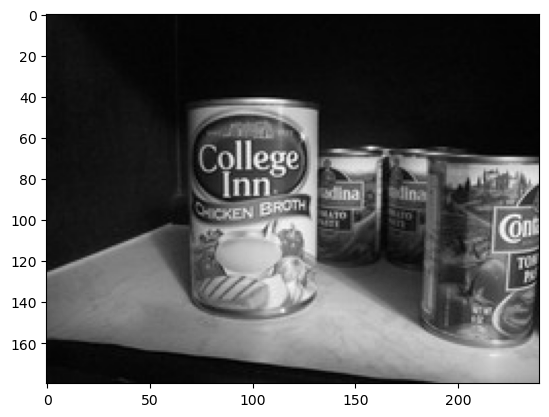

In [14]:
img2 = cv.imread("imgs/can/can1.jpg",cv.IMREAD_GRAYSCALE)
img2 = (img2 - np.min(img2))/(np.max(img2)-np.min(img2))

plt.imshow(img2,cmap='gray')
plt.show()

Nakon učitavanja slike kao grayscale, sprovodimo isti postupak kao i na prvoj slici kako bismo dobili obeležja i njihove deskriptore.

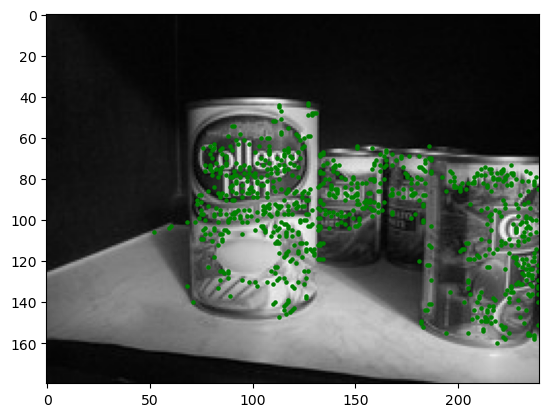

In [15]:
pyramid2 = createPyramid(img2)

DoGPyramid2 = []
for i in range(1,len(pyramid2)):
    DoGPyramid2.append(pyramid2[i]-pyramid2[i-1])

features2 = detectDoGFeatures(DoGPyramid2)

height, width = img2.shape
extremum_mask = np.zeros((height,width),dtype = np.byte)
for i in range(len(features2)):
    extremum_mask[features2[i][0],features2[i][1]] = 1
    
y, x = np.where(extremum_mask == 1)

plt.figure()
plt.imshow(img2,cmap='gray')
plt.scatter(x,y,c='green',marker='o',s=5)
plt.show()

Sada na prethodno opisan način uparujemo obeležja koristeći prag količničkog testa od $0.8$ i sa uključenom unakrsnom proverom. Iako je nekoliko obeležja uparena sa obeležijima na drugim konzervama deluje da je velika većina dobro uparena. Rezultati uparivanja su prikazani na slici ispod.

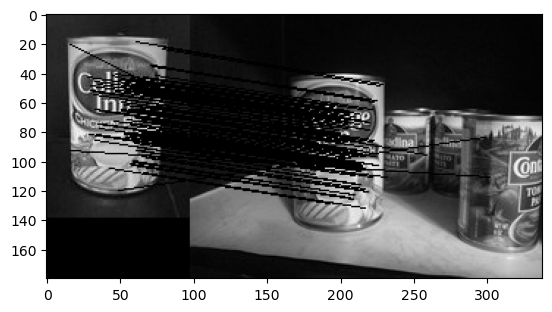

In [16]:
descBRIEF2, locBRIEF2 = computePyrBRIEF(pyramid2,features2,p1Coords,p2Coords)

matches = matchBRIEF(descBRIEF,locBRIEF,descBRIEF2,locBRIEF2,ratioThr=0.8,crossCheck=True)

combined_image = np.zeros((max(img.shape[0],img2.shape[0]),img.shape[1]+img2.shape[1]))

combined_image[:img.shape[0], :img.shape[1]] = img
combined_image[:img2.shape[0], img.shape[1]:] = img2


for pt1, pt2, other in matches:
    
    pt1 = np.flip(pt1,0)
    pt2 = np.flip(pt2,0)
    
    cv.line(combined_image,pt1,pt2 + [img.shape[1],0],(0,255,0),1)

plt.imshow(combined_image, cmap='gray')
plt.show()

Sledeći zadatak jeste provera invarijantnosti opisane metode uparivanja pomoću BRIEF deskriptora na standardne operacije kao što su rotacije, skaliranje, afina transformacija i homografija. Proveru vršimo na slici modela konzerve tako što nađemo obeležja i deskriptore na originalnoj slici, zatim izvršimo poznatu transformaciju i na takvoj slici nađemo obelžja i deskriptore. Sada sprovedemo proces uparivanja i proveravamo da li su tačke ispravno uparene tako što koordinate obeležja na transformisanoj slici transformišemo primenom inverzne transformacije u odnosu na polaznu. Uparivanje smatramo uspešnim ukoliko je zbir absolutnih razlika koordinata obeležja ne veći od 3. Isprobane su rotacija za 10, 40, 80, 160, skaliranje za 0.5, 2 i 4 kao i proizvoljna afina transformacija i homografija.

In [73]:
def to_homogeneous_coords(het_coords):
  hom_coords = np.ones((het_coords.shape[0], 3))

  for i in range(0, hom_coords.shape[0]):
    hom_coords[i][:2] = het_coords[i][:]
    
  return hom_coords

def to_heterogeneous_coords(hom_coords):
  return hom_coords[:,:2]/hom_coords[:,[-1]]

def rotateImage(image, angle):
  image_center = tuple(np.array(image.shape[1::-1]) / 2)
  rot_mat = cv.getRotationMatrix2D(image_center, angle, 1.0)
  result = cv.warpAffine(image, rot_mat, image.shape[1::-1], flags=cv.INTER_LINEAR)
  return result

def rotationMatrix(angle):
    
    angle = math.radians(angle)
    return np.array([[math.cos(angle), -math.sin(angle), 0],
                     [math.sin(angle),  math.cos(angle), 0],
                     [            0,              0, 1]])

def translationMatrix(t):
    
    return np.array([[1, 0, t[0]],
                     [0, 1, t[1]],
                     [0, 0,   1]])

def scalingMatrix(s):
    return np.array([[s[0],    0, 0],
                     [   0, s[1], 0],
                     [   0,    0, 1]])

def scaleImage(image,s):
        return cv.resize(image,None,fx=s,fy=s,interpolation=cv.INTER_NEAREST)
    
def transform(image,H):
    
    h,w = image.shape
    
    outline = np.float32([[0,0], [w, 0], [w, h], [0, h]])
    outline_h = to_homogeneous_coords(outline)
    outline_warped_h = np.transpose(H @ np.transpose(outline_h))
    outline_warped = to_heterogeneous_coords(outline_warped_h)
    
    [x_min, y_min] = outline_warped.min(axis=0)
    [x_max, y_max] = outline_warped.max(axis=0)
    
    T = translationMatrix([-x_min,-y_min])

    h_out = np.int32(y_max - y_min)
    w_out = np.int32(x_max - x_min)
    
    return cv.warpPerspective(image,T@H,(w_out,h_out)), T

def checkInvariance(matches,H):
    N = len(matches)
    hits = 0
    H = np.linalg.inv(H)
    for match in matches:
        m1 = match[0]
        m2 = match[1]


        m2_h = to_homogeneous_coords(np.float32([[m2[1],m2[0]]]))
        m2_warped_h = np.transpose(H @ np.transpose(m2_h))
        m2_warped = to_heterogeneous_coords(m2_warped_h)


        m1_flipped = [m1[1],m1[0]]
        
        if np.sum(np.abs(m1-m2_warped)) <= 3:
            hits += 1

    return (hits,N)

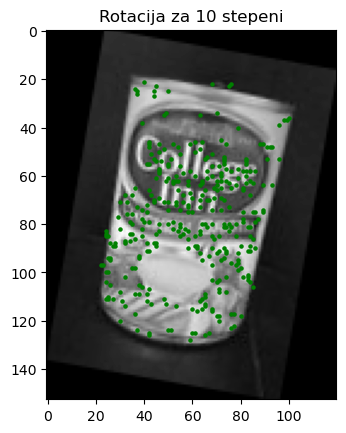

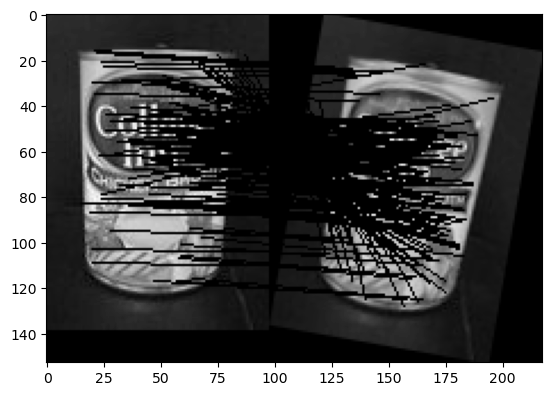

140 out of 194 matches were correct which is 72.16494845360825 percent accuracy


In [74]:
### ROTATION INVARIANCE 10 degrees

H = rotationMatrix(10)
rot, T = transform(img,H)

pyramid_rot = createPyramid(rot)

DoGPyramid_rot = []
for i in range(1,len(pyramid_rot)):
    DoGPyramid_rot.append(pyramid_rot[i]-pyramid_rot[i-1])

features_rot = detectDoGFeatures(DoGPyramid_rot)

height, width = rot.shape
extremum_mask = np.zeros((height,width),dtype = np.byte)
for i in range(len(features_rot)):
    extremum_mask[features_rot[i][0],features_rot[i][1]] = 1
    
y, x = np.where(extremum_mask == 1)

plt.figure()
plt.imshow(rot,cmap='gray')
plt.title("Rotacija za 10 stepeni")
plt.scatter(x,y,c='green',marker='o',s=5)
plt.show()

descBRIEF_rot, locBRIEF_rot = computePyrBRIEF(pyramid_rot,features_rot,p1Coords,p2Coords)

matches = matchBRIEF(descBRIEF,locBRIEF,descBRIEF_rot,locBRIEF_rot,ratioThr=0.8,crossCheck=True)

combined_image = np.zeros((max(img.shape[0],rot.shape[0]),img.shape[1]+rot.shape[1]))

combined_image[:img.shape[0], :img.shape[1]] = img
combined_image[:rot.shape[0], img.shape[1]:] = rot


for pt1, pt2, other in matches:
    
    pt1 = np.flip(pt1,0)
    pt2 = np.flip(pt2,0)
    
    cv.line(combined_image,pt1,pt2 + [img.shape[1],0],(0,255,0),1)

plt.imshow(combined_image,cmap='gray')
plt.show()

hits, N = checkInvariance(matches,T@H)
print(f"{hits} out of {N} matches were correct which is {hits/N*100} percent accuracy")

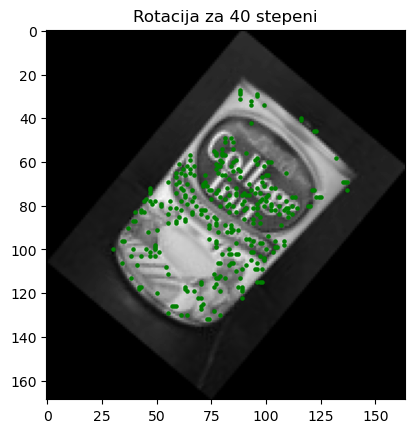

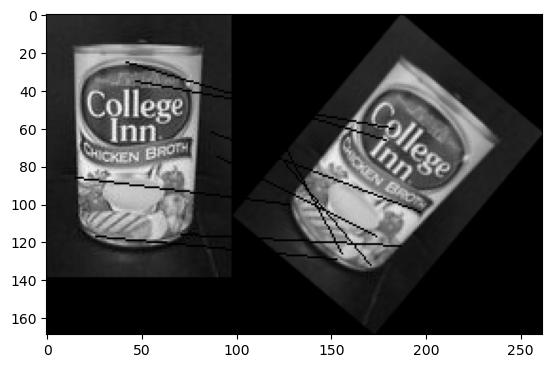

1 out of 10 matches were correct which is 10.0 percent accuracy


In [75]:
### ROTATION INVARIANCE 40 degrees

H = rotationMatrix(40)
rot, T = transform(img,H)

pyramid_rot = createPyramid(rot)

DoGPyramid_rot = []
for i in range(1,len(pyramid_rot)):
    DoGPyramid_rot.append(pyramid_rot[i]-pyramid_rot[i-1])

features_rot = detectDoGFeatures(DoGPyramid_rot)

height, width = rot.shape
extremum_mask = np.zeros((height,width),dtype = np.byte)
for i in range(len(features_rot)):
    extremum_mask[features_rot[i][0],features_rot[i][1]] = 1
    
y, x = np.where(extremum_mask == 1)

plt.figure()
plt.imshow(rot,cmap='gray')
plt.title("Rotacija za 40 stepeni")
plt.scatter(x,y,c='green',marker='o',s=5)
plt.show()

descBRIEF_rot, locBRIEF_rot = computePyrBRIEF(pyramid_rot,features_rot,p1Coords,p2Coords)

matches = matchBRIEF(descBRIEF,locBRIEF,descBRIEF_rot,locBRIEF_rot,ratioThr=0.8,crossCheck=True)

combined_image = np.zeros((max(img.shape[0],rot.shape[0]),img.shape[1]+rot.shape[1]))

combined_image[:img.shape[0], :img.shape[1]] = img
combined_image[:rot.shape[0], img.shape[1]:] = rot


for pt1, pt2, other in matches:
    
    pt1 = np.flip(pt1,0)
    pt2 = np.flip(pt2,0)
    
    cv.line(combined_image,pt1,pt2 + [img.shape[1],0],(0,255,0),1)

plt.imshow(combined_image,cmap='gray')
plt.show()

hits, N = checkInvariance(matches,T@H)
print(f"{hits} out of {N} matches were correct which is {hits/N*100} percent accuracy")

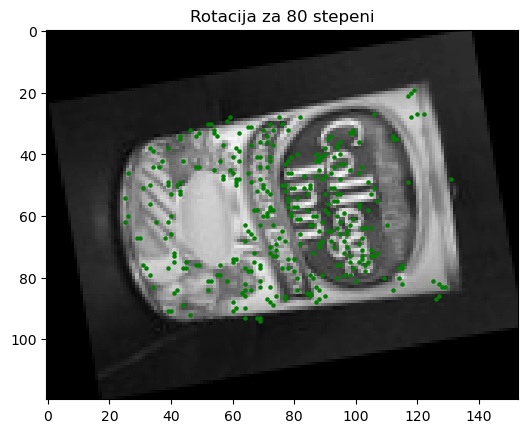

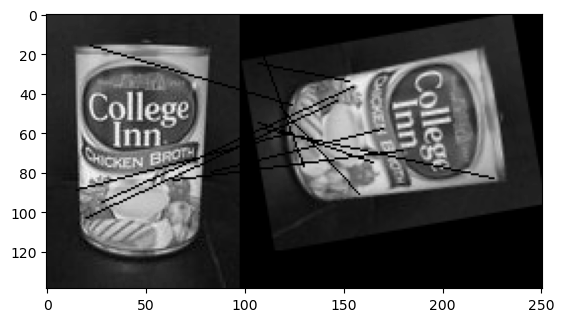

0 out of 11 matches were correct which is 0.0 percent accuracy


In [76]:
### ROTATION INVARIANCE 80 degrees

H = rotationMatrix(80)
rot, T = transform(img,H)

pyramid_rot = createPyramid(rot)

DoGPyramid_rot = []
for i in range(1,len(pyramid_rot)):
    DoGPyramid_rot.append(pyramid_rot[i]-pyramid_rot[i-1])

features_rot = detectDoGFeatures(DoGPyramid_rot)

height, width = rot.shape
extremum_mask = np.zeros((height,width),dtype = np.byte)
for i in range(len(features_rot)):
    extremum_mask[features_rot[i][0],features_rot[i][1]] = 1
    
y, x = np.where(extremum_mask == 1)

plt.figure()
plt.imshow(rot,cmap='gray')
plt.title("Rotacija za 80 stepeni")
plt.scatter(x,y,c='green',marker='o',s=5)
plt.show()

descBRIEF_rot, locBRIEF_rot = computePyrBRIEF(pyramid_rot,features_rot,p1Coords,p2Coords)

matches = matchBRIEF(descBRIEF,locBRIEF,descBRIEF_rot,locBRIEF_rot,ratioThr=0.8,crossCheck=True)

combined_image = np.zeros((max(img.shape[0],rot.shape[0]),img.shape[1]+rot.shape[1]))

combined_image[:img.shape[0], :img.shape[1]] = img
combined_image[:rot.shape[0], img.shape[1]:] = rot


for pt1, pt2, other in matches:
    
    pt1 = np.flip(pt1,0)
    pt2 = np.flip(pt2,0)
    
    cv.line(combined_image,pt1,pt2 + [img.shape[1],0],(0,255,0),1)

plt.imshow(combined_image,cmap='gray')
plt.show()

hits, N = checkInvariance(matches,T@H)
print(f"{hits} out of {N} matches were correct which is {hits/N*100} percent accuracy")

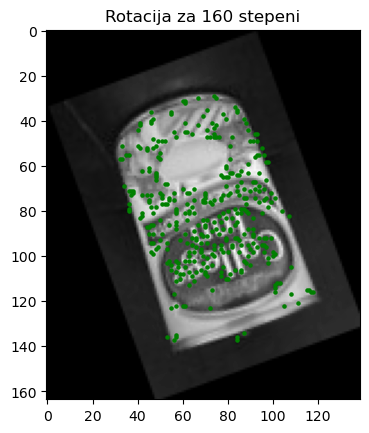

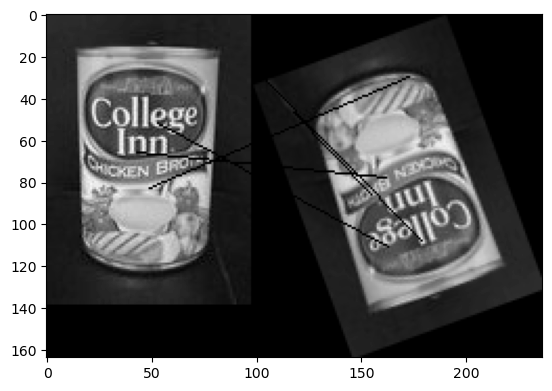

0 out of 5 matches were correct which is 0.0 percent accuracy


In [77]:
### ROTATION INVARIANCE 160 degrees

H = rotationMatrix(160)
rot, T = transform(img,H)

pyramid_rot = createPyramid(rot)

DoGPyramid_rot = []
for i in range(1,len(pyramid_rot)):
    DoGPyramid_rot.append(pyramid_rot[i]-pyramid_rot[i-1])

features_rot = detectDoGFeatures(DoGPyramid_rot)

height, width = rot.shape
extremum_mask = np.zeros((height,width),dtype = np.byte)
for i in range(len(features_rot)):
    extremum_mask[features_rot[i][0],features_rot[i][1]] = 1
    
y, x = np.where(extremum_mask == 1)

plt.figure()
plt.imshow(rot,cmap='gray')
plt.title("Rotacija za 160 stepeni")
plt.scatter(x,y,c='green',marker='o',s=5)
plt.show()

descBRIEF_rot, locBRIEF_rot = computePyrBRIEF(pyramid_rot,features_rot,p1Coords,p2Coords)

matches = matchBRIEF(descBRIEF,locBRIEF,descBRIEF_rot,locBRIEF_rot,ratioThr=0.8,crossCheck=True)

combined_image = np.zeros((max(img.shape[0],rot.shape[0]),img.shape[1]+rot.shape[1]))

combined_image[:img.shape[0], :img.shape[1]] = img
combined_image[:rot.shape[0], img.shape[1]:] = rot


for pt1, pt2, other in matches:
    
    pt1 = np.flip(pt1,0)
    pt2 = np.flip(pt2,0)
    
    cv.line(combined_image,pt1,pt2 + [img.shape[1],0],(0,255,0),1)

plt.imshow(combined_image,cmap='gray')
plt.show()

hits, N = checkInvariance(matches,T@H)
print(f"{hits} out of {N} matches were correct which is {hits/N*100} percent accuracy")

Na osnovu ove analize možemo zaključiti da BRIEF deskriptor nije invarijantan na rotaciju u opštem slučaju. Za neke manje vrednosti ugla rotacije (npr. 10 stepeni) se može dobiti zadovoljavajuće uparivanje dok za bilo koje veće vrednosti uparivanje postaje neuspešno. Ove se može popraviti uvođenjem ORB deskriptora koji određuje karakterističnu orijentaciju svakog obeležja i onda rotira čitavo obeležje tako da se ta karakteristična orijentacija nalazi pod unapred poznatim uglom. 

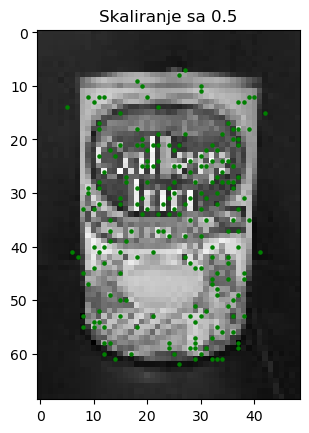

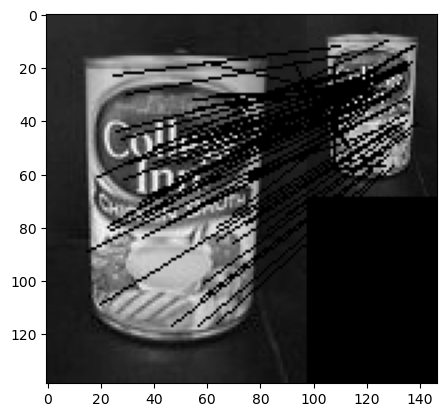

31 out of 68 matches were correct which is 45.588235294117645 percent accuracy


In [78]:
### SCALING INVARIANCE 0.5

H = scalingMatrix([0.5,0.5])
rot, T = transform(img,H)

pyramid_rot = createPyramid(rot)

DoGPyramid_rot = []
for i in range(1,len(pyramid_rot)):
    DoGPyramid_rot.append(pyramid_rot[i]-pyramid_rot[i-1])

features_rot = detectDoGFeatures(DoGPyramid_rot)

height, width = rot.shape
extremum_mask = np.zeros((height,width),dtype = np.byte)
for i in range(len(features_rot)):
    extremum_mask[features_rot[i][0],features_rot[i][1]] = 1
    
y, x = np.where(extremum_mask == 1)

plt.figure()
plt.imshow(rot,cmap='gray')
plt.title("Skaliranje sa 0.5")
plt.scatter(x,y,c='green',marker='o',s=5)
plt.show()

descBRIEF_rot, locBRIEF_rot = computePyrBRIEF(pyramid_rot,features_rot,p1Coords,p2Coords)

matches = matchBRIEF(descBRIEF,locBRIEF,descBRIEF_rot,locBRIEF_rot,ratioThr=0.8,crossCheck=True)

combined_image = np.zeros((max(img.shape[0],rot.shape[0]),img.shape[1]+rot.shape[1]))

combined_image[:img.shape[0], :img.shape[1]] = img
combined_image[:rot.shape[0], img.shape[1]:] = rot


for pt1, pt2, other in matches:
    
    pt1 = np.flip(pt1,0)
    pt2 = np.flip(pt2,0)
    
    cv.line(combined_image,pt1,pt2 + [img.shape[1],0],(0,255,0),1)

plt.imshow(combined_image,cmap='gray')
plt.show()

hits, N = checkInvariance(matches,T@H)
print(f"{hits} out of {N} matches were correct which is {hits/N*100} percent accuracy")

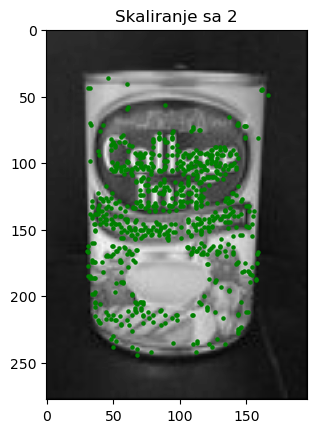

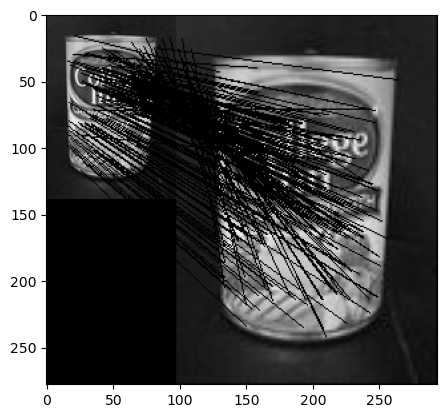

104 out of 209 matches were correct which is 49.760765550239235 percent accuracy


In [79]:
### SCALING INVARIANCE 2

H = scalingMatrix([2,2])
rot, T = transform(img,H)

pyramid_rot = createPyramid(rot)

DoGPyramid_rot = []
for i in range(1,len(pyramid_rot)):
    DoGPyramid_rot.append(pyramid_rot[i]-pyramid_rot[i-1])

features_rot = detectDoGFeatures(DoGPyramid_rot)

height, width = rot.shape
extremum_mask = np.zeros((height,width),dtype = np.byte)
for i in range(len(features_rot)):
    extremum_mask[features_rot[i][0],features_rot[i][1]] = 1
    
y, x = np.where(extremum_mask == 1)

plt.figure()
plt.imshow(rot,cmap='gray')
plt.title("Skaliranje sa 2")
plt.scatter(x,y,c='green',marker='o',s=5)
plt.show()

descBRIEF_rot, locBRIEF_rot = computePyrBRIEF(pyramid_rot,features_rot,p1Coords,p2Coords)

matches = matchBRIEF(descBRIEF,locBRIEF,descBRIEF_rot,locBRIEF_rot,ratioThr=0.8,crossCheck=True)

combined_image = np.zeros((max(img.shape[0],rot.shape[0]),img.shape[1]+rot.shape[1]))

combined_image[:img.shape[0], :img.shape[1]] = img
combined_image[:rot.shape[0], img.shape[1]:] = rot


for pt1, pt2, other in matches:
    
    pt1 = np.flip(pt1,0)
    pt2 = np.flip(pt2,0)
    
    cv.line(combined_image,pt1,pt2 + [img.shape[1],0],(0,255,0),1)

plt.imshow(combined_image,cmap='gray')
plt.show()

hits, N = checkInvariance(matches,T@H)
print(f"{hits} out of {N} matches were correct which is {hits/N*100} percent accuracy")

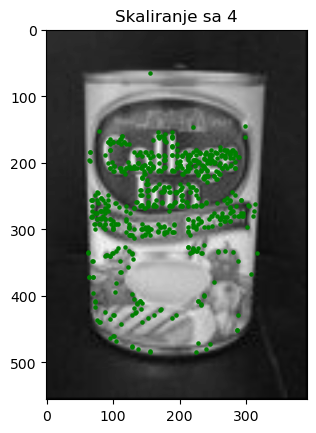

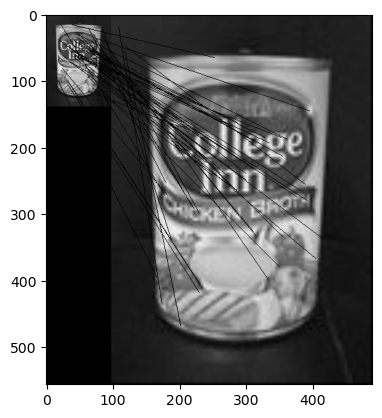

17 out of 52 matches were correct which is 32.69230769230769 percent accuracy


In [80]:
### SCALING INVARIANCE 4

H = scalingMatrix([4,4])
rot, T = transform(img,H)

pyramid_rot = createPyramid(rot)

DoGPyramid_rot = []
for i in range(1,len(pyramid_rot)):
    DoGPyramid_rot.append(pyramid_rot[i]-pyramid_rot[i-1])

features_rot = detectDoGFeatures(DoGPyramid_rot)

height, width = rot.shape
extremum_mask = np.zeros((height,width),dtype = np.byte)
for i in range(len(features_rot)):
    extremum_mask[features_rot[i][0],features_rot[i][1]] = 1
    
y, x = np.where(extremum_mask == 1)

plt.figure()
plt.imshow(rot,cmap='gray')
plt.title("Skaliranje sa 4")
plt.scatter(x,y,c='green',marker='o',s=5)
plt.show()

descBRIEF_rot, locBRIEF_rot = computePyrBRIEF(pyramid_rot,features_rot,p1Coords,p2Coords)

matches = matchBRIEF(descBRIEF,locBRIEF,descBRIEF_rot,locBRIEF_rot,ratioThr=0.8,crossCheck=True)

combined_image = np.zeros((max(img.shape[0],rot.shape[0]),img.shape[1]+rot.shape[1]))

combined_image[:img.shape[0], :img.shape[1]] = img
combined_image[:rot.shape[0], img.shape[1]:] = rot


for pt1, pt2, other in matches:
    
    pt1 = np.flip(pt1,0)
    pt2 = np.flip(pt2,0)
    
    cv.line(combined_image,pt1,pt2 + [img.shape[1],0],(0,255,0),1)

plt.imshow(combined_image,cmap='gray')
plt.show()

hits, N = checkInvariance(matches,T@H)
print(f"{hits} out of {N} matches were correct which is {hits/N*100} percent accuracy")

Iako ne uspeva da na pravi način upari sva obeležja, pokazuje se da i za veće vrednosti skaliranja algoritam uspeva da neki deo tačaka ispravno upari te bi se mogao koristiti u primenama gde su objekti samo skalirani.

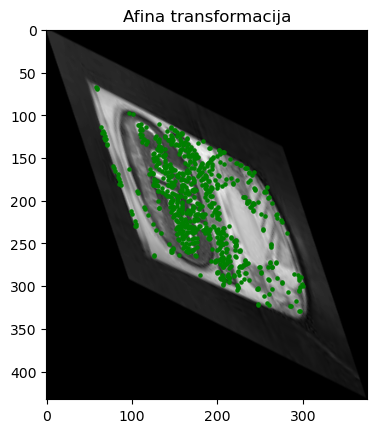

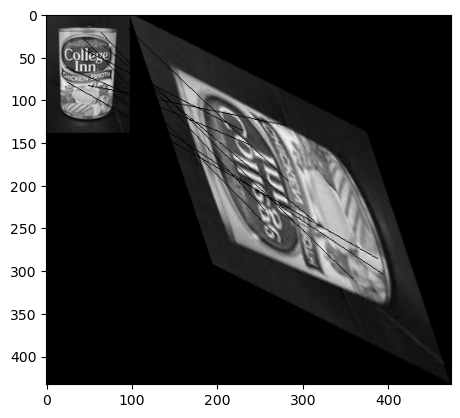

0 out of 10 matches were correct which is 0.0 percent accuracy


In [81]:
### AFFINE INVARIANCE

H = np.array([[1,2,0],[3,1,0],[0,0,1]])
rot, T = transform(img,H)

pyramid_rot = createPyramid(rot)

DoGPyramid_rot = []
for i in range(1,len(pyramid_rot)):
    DoGPyramid_rot.append(pyramid_rot[i]-pyramid_rot[i-1])

features_rot = detectDoGFeatures(DoGPyramid_rot)

height, width = rot.shape
extremum_mask = np.zeros((height,width),dtype = np.byte)
for i in range(len(features_rot)):
    extremum_mask[features_rot[i][0],features_rot[i][1]] = 1
    
y, x = np.where(extremum_mask == 1)

plt.figure()
plt.imshow(rot,cmap='gray')
plt.title("Afina transformacija")
plt.scatter(x,y,c='green',marker='o',s=5)
plt.show()

descBRIEF_rot, locBRIEF_rot = computePyrBRIEF(pyramid_rot,features_rot,p1Coords,p2Coords)

matches = matchBRIEF(descBRIEF,locBRIEF,descBRIEF_rot,locBRIEF_rot,ratioThr=0.8,crossCheck=True)

combined_image = np.zeros((max(img.shape[0],rot.shape[0]),img.shape[1]+rot.shape[1]))

combined_image[:img.shape[0], :img.shape[1]] = img
combined_image[:rot.shape[0], img.shape[1]:] = rot


for pt1, pt2, other in matches:
    
    pt1 = np.flip(pt1,0)
    pt2 = np.flip(pt2,0)
    
    cv.line(combined_image,pt1,pt2 + [img.shape[1],0],(0,255,0),1)

plt.imshow(combined_image,cmap='gray')
plt.show()

hits, N = checkInvariance(matches,T@H)
print(f"{hits} out of {N} matches were correct which is {hits/N} percent accuracy")

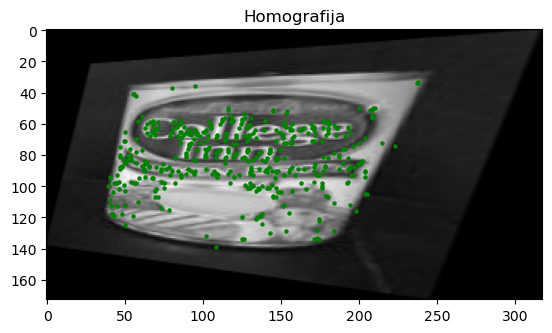

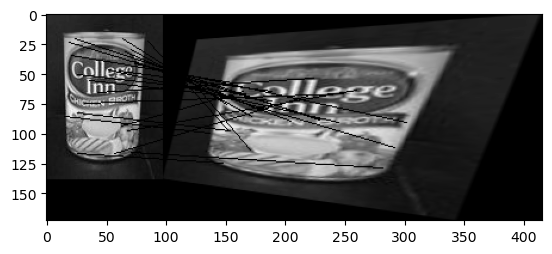

4 out of 24 matches were correct which is 16.666666666666664 percent accuracy


In [82]:
### HOMOGRAPHY INVARIANCE

H = np.array([[ 6.63282705e-01, -3.10679072e-02,  3.62632869e+02],
               [-7.89892174e-02,  8.88108268e-01, -1.96059905e+01],
               [-3.51460991e-03,  5.32544028e-04,  1.00000000e+00]])
rot, T = transform(img,H)

pyramid_rot = createPyramid(rot)

DoGPyramid_rot = []
for i in range(1,len(pyramid_rot)):
    DoGPyramid_rot.append(pyramid_rot[i]-pyramid_rot[i-1])

features_rot = detectDoGFeatures(DoGPyramid_rot)

height, width = rot.shape
extremum_mask = np.zeros((height,width),dtype = np.byte)
for i in range(len(features_rot)):
    extremum_mask[features_rot[i][0],features_rot[i][1]] = 1
    
y, x = np.where(extremum_mask == 1)

plt.figure()
plt.imshow(rot,cmap='gray')
plt.title("Homografija")
plt.scatter(x,y,c='green',marker='o',s=5)
plt.show()

descBRIEF_rot, locBRIEF_rot = computePyrBRIEF(pyramid_rot,features_rot,p1Coords,p2Coords)

matches = matchBRIEF(descBRIEF,locBRIEF,descBRIEF_rot,locBRIEF_rot,ratioThr=0.8,crossCheck=True)

combined_image = np.zeros((max(img.shape[0],rot.shape[0]),img.shape[1]+rot.shape[1]))

combined_image[:img.shape[0], :img.shape[1]] = img
combined_image[:rot.shape[0], img.shape[1]:] = rot


for pt1, pt2, other in matches:
    
    pt1 = np.flip(pt1,0)
    pt2 = np.flip(pt2,0)
    
    cv.line(combined_image,pt1,pt2 + [img.shape[1],0],(0,255,0),1)

plt.imshow(combined_image,cmap='gray')
plt.show()

hits, N = checkInvariance(matches,T@H)
print(f"{hits} out of {N} matches were correct which is {hits/N*100} percent accuracy")

BRIEF deskriptor nije robusan ni na afinu transformaciju ni na homografiju u opštem slučaju što je i očekivano jer nije bio robustan u opštem slučaju ni na rotaciju čije su ove transformacije nadskup. Vidimo da su neke tačke ispravno uparene kod homografije ali to je najverovatnije zbog toga što je izabrana homografija sa slabom rotacijom.

Pored pronalaženje objekta na slikama još jedna česta primena uparivanja obeležja jeste pravljenje panorama. Cilj je da se od niza ručno napravljenih slika dobije jedna slika mnogo šireg FOV-a. Problem bi bio jednostavan ukoliko bi se slike pravile mašinski odnosno ako bi bile samo translirane jedna u odnosu na drugu, međutim, ručno slikane slike će biti translirane, rotirane, skalirane itd. Algoritam radi tako što se nađu i upare obeležja na dve slike i onda se nađe nepoznata transformacija između slika (u opštem slučaju homografija). Sada je moguće jednu sliku transformisati i spojiti sa drugom dobijajući panoramu. Prvo ćemo pokušati da ovo izvedemo koristeći razvijeno uparivanje na bazi BRIEF deskriptora na primeru sledeće dve slike.

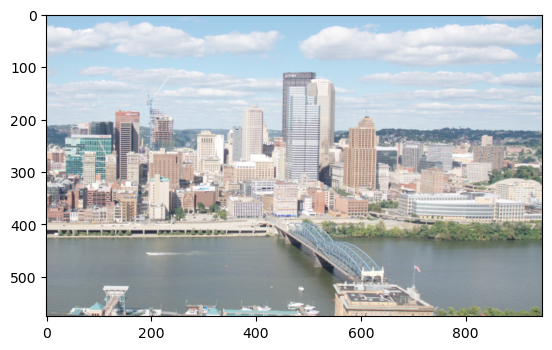

In [83]:
left_img = cv.imread("imgs/pano/pano1.png")
left_img = cv.cvtColor(left_img,cv.COLOR_BGR2RGB)


plt.imshow(left_img)
plt.show()

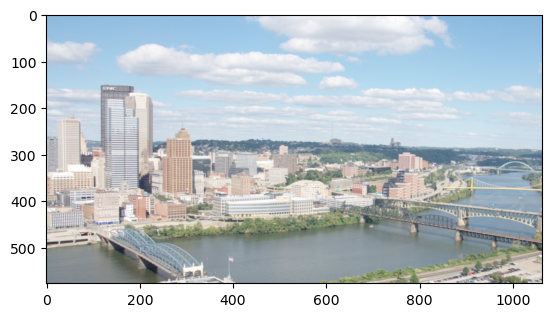

In [84]:
right_img = cv.imread("imgs/pano/pano2.png")
right_img = cv.cvtColor(right_img,cv.COLOR_BGR2RGB)


plt.imshow(right_img)
plt.show()

In [85]:
def warpImages(left_img, right_img, H):
  
  h_right, w_right = right_img.shape[:2]
  h_left, w_left = left_img.shape[:2]

  outline_right = np.float32([[0,0], [w_right, 0], [w_right, h_right], [0, h_right]])
  outline_right_h = to_homogeneous_coords(outline_right)
  outline_right_warped_h = np.transpose(H @ np.transpose(outline_right_h))

  outline_left = np.float32([[0,0], [w_left, 0], [w_left, h_left], [0, h_left]])
  outline_left_h = to_homogeneous_coords(outline_left)
  outline_right_warped = to_heterogeneous_coords(outline_right_warped_h)

  outline_stack = np.concatenate((outline_right_warped, outline_left), axis=0)

  [x_min, y_min] = outline_stack.min(axis=0)
  [x_max, y_max] = outline_stack.max(axis=0)

  h_out = np.int32(y_max - y_min)
  w_out = np.int32(x_max - x_min)
  
  T = np.array([[1, 0, -x_min], [0, 1, -y_min], [0, 0, 1]])

  mask_right = np.ones_like(right_img)
  mask_left = np.ones_like(left_img)

  img_right_warped = cv.warpPerspective(right_img,T@H, (w_out, h_out))
  mask_right = cv.warpPerspective(mask_right,T@H, (w_out, h_out))

  img_left_warped = cv.warpPerspective(left_img,  T, (w_out, h_out))
  mask_left = cv.warpPerspective(mask_left,  T, (w_out, h_out))

  output_img = np.zeros((h_out, w_out, 3))

  output_img[mask_right>0] = img_right_warped[mask_right>0]
  output_img[mask_left>0] = img_left_warped[mask_left>0]

  return output_img

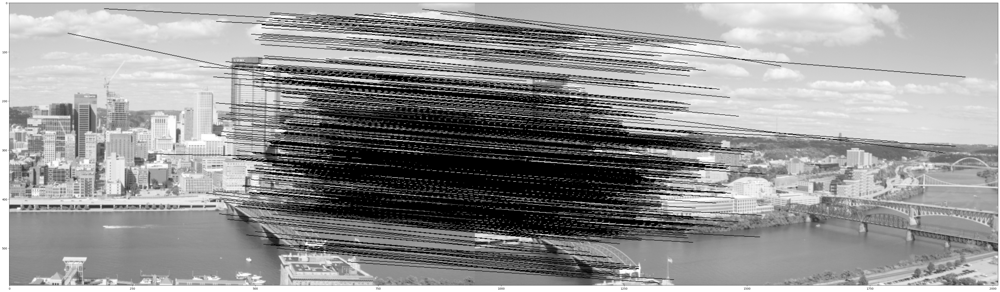

In [86]:
left_img_gray = cv.cvtColor(left_img,cv.COLOR_RGB2GRAY)
right_img_gray = cv.cvtColor(right_img,cv.COLOR_RGB2GRAY)

pyramid_left = createPyramid(left_img_gray)
pyramid_right = createPyramid(right_img_gray)

DoGPyramid_left = []
for i in range(1,len(pyramid_left)):
   DoGPyramid_left.append(pyramid_left[i]-pyramid_left[i-1])
    
DoGPyramid_right = []
for i in range(1,len(pyramid_right)):
   DoGPyramid_right.append(pyramid_right[i]-pyramid_right[i-1])

features_left_BRIEF = detectDoGFeatures(DoGPyramid_left,0.1,1)
features_right_BRIEF = detectDoGFeatures(DoGPyramid_right,0.1,1)

descBRIEF_left, locBRIEF_left = computePyrBRIEF(pyramid_left,features_left_BRIEF,p1Coords,p2Coords)
descBRIEF_right, locBRIEF_right = computePyrBRIEF(pyramid_right,features_right_BRIEF,p1Coords,p2Coords)

matchesBRIEF = matchBRIEF(descBRIEF_left,locBRIEF_left,descBRIEF_right,locBRIEF_right,ratioThr=0.5,crossCheck=True)

combined_image = np.zeros((max(left_img_gray.shape[0],right_img_gray.shape[0]),left_img_gray.shape[1]+right_img_gray.shape[1]))

combined_image[:left_img_gray.shape[0], :left_img_gray.shape[1]] = left_img_gray
combined_image[:right_img_gray.shape[0], left_img_gray.shape[1]:] = right_img_gray


for pt1, pt2, other in matchesBRIEF:
    
    pt1 = np.flip(pt1,0)
    pt2 = np.flip(pt2,0)
    
    cv.line(combined_image,pt1,pt2 + [left_img_gray.shape[1],0],(0,255,0),1)

plt.figure(figsize=(64,64))
plt.imshow(combined_image, cmap='gray')
plt.show()

Nakon uparivanja tražimo nepoznatu homografiju između dve slike koristeći RANSAC algoritam. RANSAC algoritam funkcioniše tako što se izabere onoliko parova tačaka koliko je minimalno potrebno da se pronađe nepoznata transformacija (za homografiju je to 4). Homografija se dobija rešavanjem matrične jednačine $AH = B$, matrice su date u kodu ispod. Nakon toga se pronađena transformacija izvrši nad svim parovima sa druge slike i uporedi sa parovima na prvoj slici. Ukoliko je odstupanje dovojno malo tačka se tretira kao inliner. Ovaj postupak se ponavlja K (2000 u našem slučaju) puta i uzima se ona transformacija koja je dala najviše inliera. Na ovaj način outlier-i odnosno pogrešno uparene tačke neće imati uticaj na krajnji rezultat ukoliko postoji dovoljno velike broj dobro uparenih tačaka. Kako bi rezultati bili ponovljivi i ovde je fiksiran seed.

In [87]:
def findHomographyBRIEF(K,matches,features_left,features_right):
    np.random.seed(0)
    
    max_inliners = -1
    h = []
    
    for k in range(K):
        
        inliners = 0
        
        rnd = np.random.randint(len(matches),size=4)
        y1_, x1_ = matches[rnd[0]][0]
        y1, x1   = matches[rnd[0]][1]
        y2_, x2_ = matches[rnd[1]][0]
        y2, x2   = matches[rnd[1]][1]
        y3_, x3_ = matches[rnd[2]][0]
        y3, x3   = matches[rnd[2]][1]
        y4_, x4_ = matches[rnd[3]][0]
        y4, x4   = matches[rnd[3]][1]
        
        A = np.array([[-x1,-y1,-1,0,0,0,x1*x1_,y1*x1_],
                     [0,0,0,-x1,-y1,-1,x1*y1_,y1*y1_],
                     [-x2,-y2,-1,0,0,0,x2*x2_,y2*x2_],
                     [0,0,0,-x2,-y2,-1,x2*y2_,y2*y2_],
                     [-x3,-y3,-1,0,0,0,x3*x3_,y3*x3_],
                     [0,0,0,-x3,-y3,-1,x3*y3_,y3*y3_],
                     [-x4,-y4,-1,0,0,0,x4*x4_,y4*x4_],
                     [0,0,0,-x4,-y4,-1,x4*y4_,y4*y4_]])

        B = -np.array([[x1_],[y1_],[x2_],[y2_],[x3_],[y3_],[x4_],[y4_]])

        if (np.linalg.det(A) > 0):
            h1,h2,h3,h4,h5,h6,h7,h8 = np.linalg.solve(A,B)

            for i in range(len(matches)):
                match = matches[i]
                x,y = match[1]
                x_target, y_target = match[0]

                x_ = (h1*x + h2*y + h3) / (h7*x + h8*y + 1)
                y_ = (h4*x + h5*y + h6) / (h7*x + h8*y + 1)

                if ((x_ - x_target)**2 + (y_ - y_target)**2) < 2:
                    inliners += 1

            if inliners > max_inliners:
                
                max_inliners = inliners
                h = [h1[0],h2[0],h3[0],h4[0],h5[0],h6[0],h7[0],h8[0]]
    
    h.append(1.0)
    H = np.array(h).reshape(3,3)
    
    return H
    
def findHomographyRANSAC(K,good,features_left,features_right):

    np.random.seed(0)

    max_inliners = -1
    h = []

    for k in range(K):

        inliners = 0

        m = good[np.random.randint(len(good),size=4)]
        x1_,y1_ = features_left[m[0].queryIdx].pt
        x1,y1 = features_right[m[0].trainIdx].pt
        x2_,y2_ = features_left[m[1].queryIdx].pt
        x2,y2 = features_right[m[1].trainIdx].pt
        x3_,y3_ = features_left[m[2].queryIdx].pt
        x3,y3 = features_right[m[2].trainIdx].pt
        x4_,y4_ = features_left[m[3].queryIdx].pt
        x4,y4 = features_right[m[3].trainIdx].pt

        A = np.array([[-x1,-y1,-1,0,0,0,x1*x1_,y1*x1_],
                     [0,0,0,-x1,-y1,-1,x1*y1_,y1*y1_],
                     [-x2,-y2,-1,0,0,0,x2*x2_,y2*x2_],
                     [0,0,0,-x2,-y2,-1,x2*y2_,y2*y2_],
                     [-x3,-y3,-1,0,0,0,x3*x3_,y3*x3_],
                     [0,0,0,-x3,-y3,-1,x3*y3_,y3*y3_],
                     [-x4,-y4,-1,0,0,0,x4*x4_,y4*x4_],
                     [0,0,0,-x4,-y4,-1,x4*y4_,y4*y4_]])

        B = -np.array([[x1_],[y1_],[x2_],[y2_],[x3_],[y3_],[x4_],[y4_]])

        if (np.linalg.det(A) > 0):
            h1,h2,h3,h4,h5,h6,h7,h8 = np.linalg.solve(A,B)

            for i in range(len(good)):
                match = good[i]
                x,y = features_right[match.trainIdx].pt
                x_target, y_target = features_left[match.queryIdx].pt

                x_ = (h1*x + h2*y + h3) / (h7*x + h8*y + 1)
                y_ = (h4*x + h5*y + h6) / (h7*x + h8*y + 1)

                if ((x_ - x_target)**2 + (y_ - y_target)**2) < 2:
                    inliners += 1

            if inliners > max_inliners:
                
                max_inliners = inliners
                h = [h1[0],h2[0],h3[0],h4[0],h5[0],h6[0],h7[0],h8[0]]

    h.append(1.0)
    H = np.array(h).reshape(3,3)
    
    return H

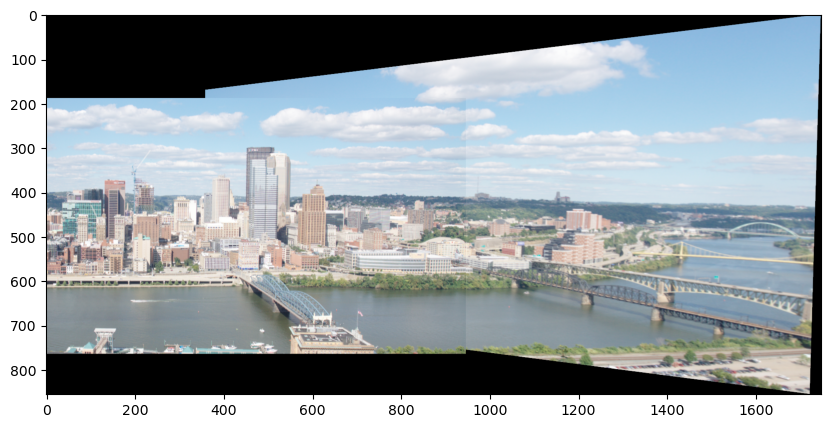

In [88]:
H1 = findHomographyBRIEF(200,matchesBRIEF,features_left_BRIEF,features_right_BRIEF)
out = warpImages(left_img,right_img,H1)
out = out.astype(np.uint8)


plt.figure(figsize=(10,6))
plt.imshow(out)
plt.show()

Vidimo da je uparvianje uspešno izvršeno iako BRIEF nije robustan na homografiju ove dve slike se dovoljno malo razlikuju (na oko deluje da je izvršena samo blaga rotacija dela slike koji se preklapa) algoritam je uspešno izvršio zadatak. Ipak, implementacija je dosta spora te ćemo u nastavku (za slučaj sa više slika) koristiti ugrađenu funkciju za SIFT algoritam iako bi se najverovatnije dobri rezultati mogli dobiti i sa BRIEF algoritmom.

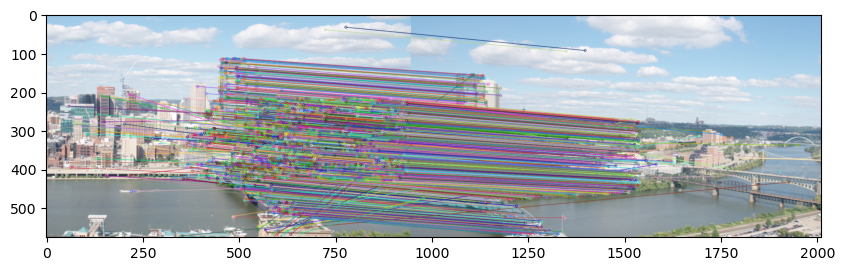

In [92]:
left_img_gray = cv.cvtColor(left_img,cv.COLOR_RGB2GRAY)
right_img_gray = cv.cvtColor(right_img,cv.COLOR_RGB2GRAY)

sift = cv.SIFT_create()
features_left, desc_left = sift.detectAndCompute(left_img_gray, None)
features_right, desc_right = sift.detectAndCompute(right_img_gray, None)

bf = cv.BFMatcher()
matches_sift = bf.knnMatch(desc_left,desc_right,k=2)

good = []
for m,n in matches_sift:
    if m.distance < 0.8*n.distance:
        good.append([m])
        
out = cv.drawMatchesKnn(left_img,features_left,right_img,features_right,good,None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(10,6))
plt.imshow(out)
plt.show()

good = np.array(good).reshape(-1)

Uparivanje deluje uredu, ali tek nakon pronalaženja homografije i spajanja slika ćemo znati sa sigurnošću da li je zaista uspešno.

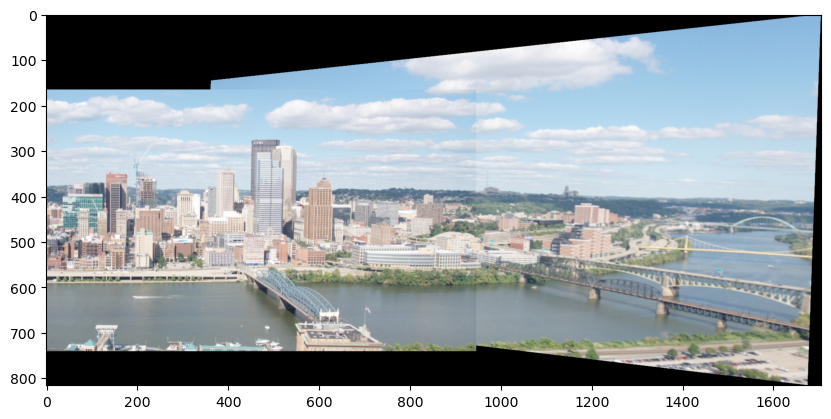

In [135]:
K = 2000
H = findHomographyRANSAC(K,good,features_left,features_right)

out = warpImages(left_img,right_img,H)
out = out.astype(np.uint8)


plt.figure(figsize=(10,6))
plt.imshow(out)
plt.show()

Možemo zaključiti da je spajanje slika veoma uspešno te zaključujemo da je i uparvianje bilo uspešno. Primećujemo linije na delovima gde su slike spojene. Ovo se može rešiti linearnom interpolacijom na mestima prelaza.

Sada ćemo pokušati da primenimo ovaj postupak na većem broju slika. Slikano je 6 slika kamerom mobilnog telefona i cilj je da se napravi panorama. Sve slike su transformisane u odnosu na četvrtu sliku u nizu. Na prethodno opisan način pronađena je homografija između svake dve susedne slike zatim je slaganjem homografija dobijena transformacija između svake slike i centralne. Ovakav pristup zahteva da su slike sortirane, kako bi se ovaj uslov prevazišao moguće je sortirati slike na osnovu broja uparenih tačaka. Naime, možemo uparati obeležja između svake dve slike i slike sa najvećim brojem uparenih obeležja predstavljaju par. Koja je slika levo a koja desno u paru možemo odrediti time na kojoj slici se obeležja nalaze većinski u desnom odnosno levom delu. Ovo nije implementirano te je neophodno da slike bude sortirane prilikom unosa. Prvo možemo videti prikazane pojedinačne slike, a zatim i panoramu. Na osnovu panorame možemo zaključiti da je spajanje veoma uspešno.

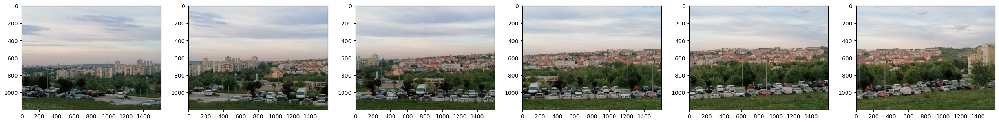

In [93]:
images = []
folder = "panorama"
file_names = os.listdir(folder)
for file in file_names:
    img = cv.imread(os.path.join(folder,file))
    img = cv.cvtColor(img,cv.COLOR_BGR2RGB)
    images.append(img)

    
for i,img in enumerate(images):
    
    plt.figure(1,figsize=(32,32))
    plt.subplot(1,len(images),i+1)
    plt.imshow(img)


In [94]:
def findHomographyList(images,K):
    
    Hs = []
    for i in range(len(images)-1):
            
        left_img_gray = cv.cvtColor(images[i+1],cv.COLOR_RGB2GRAY)
        right_img_gray = cv.cvtColor(images[i],cv.COLOR_RGB2GRAY)

        sift = cv.SIFT_create()
        features_left, desc_left = sift.detectAndCompute(left_img_gray, None)
        features_right, desc_right = sift.detectAndCompute(right_img_gray, None)

        bf = cv.BFMatcher()
        matches = bf.knnMatch(desc_left,desc_right,k=2)

        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        good = np.array(good).reshape(-1)

        Hs.append(findHomographyRANSAC(K,good,features_left,features_right))
        
    return Hs

def panoStitch(images):
    
    K = 100
    N = len(images)
    Hs = findHomographyList(images,K)
    
    central_id = N//2
    
    H = []
    for i in range(N):
        
        if i < central_id:
            
            tmp = Hs[central_id-1]
            
            j = central_id-2 
            while j >= i:
                tmp = tmp@Hs[j]
                j = j - 1
            
            H.append(tmp)
            
        elif i == central_id:
            H.append(np.eye(3))
            
        else:
            
            tmp = Hs[central_id]
            j = central_id + 1
            while j < i:
                tmp = tmp@Hs[j]
                j = j + 1
            
            H.append(np.linalg.inv(tmp))
    
    outline_in = []
    outline_in_h = []
    
    for i in range(N):
        h, w = images[i].shape[:2]
        outline_in.append(np.array([[0, 0], [w-1, 0], [w-1, h-1], [0, h-1]], dtype=np.float32))
        outline_in_h.append(np.array([[0, 0, 1], [w-1, 0, 1], [w-1, h-1, 1], [0, h-1, 1]], dtype=np.float32))
    
    outline_out = np.zeros_like(outline_in)
    outline_out_h = np.zeros_like(outline_in_h)
    
    for i in range(N):
        outline_out_h[i] = np.transpose(H[i] @ np.transpose(outline_in_h[i]))
        outline_out[i] = outline_out_h[i][:,:2]/outline_out_h[i][:,[-1]]
        
    out_x_min, out_y_min = (outline_out.min(axis=0)).min(axis=0)
    out_x_max, out_y_max = (outline_out.max(axis=0)).max(axis=0)
    
    width_out = np.int32(out_x_max - out_x_min)
    height_out = np.int32(out_y_max - out_y_min)
    
    T = np.array([[1, 0, -out_x_min],
                  [0, 1, -out_y_min],
                  [0, 0,          1]], dtype=np.float32)
    
    for i in range(N):
        outline_out[i][:] = outline_out[i][:] - [out_x_min, out_y_min]
        
    output_img = np.zeros((height_out, width_out, 3))
    
    for i in range(N):
        mask = np.ones_like(images[i])
        mask = cv.warpPerspective(mask, T@H[i], (width_out, height_out))
        temp = cv.warpPerspective(images[i], T@H[i], (width_out, height_out))
        output_img[mask>0] = temp[mask>0]
    
    return output_img.astype(np.uint8)
    

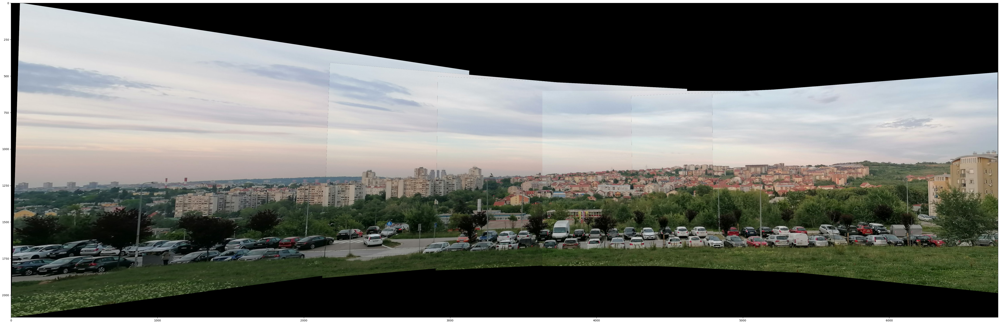

In [95]:
out = panoStitch(images)

plt.figure(figsize=(64,64))
plt.imshow(out)
plt.show()